<a href="https://colab.research.google.com/github/Simarjit1303/Projects/blob/main/Machine%20Learning/Tomato%20Disease%20Detection/Tomato_Disease_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Tomato Disease Detection using CNN Architecture with 98% accuracy

## Business Problem
Tomato plants often get sick. This can make the plants give fewer and lower-quality tomatoes. Such a drop hurts farmers' money a lot. Spotting these sicknesses soon and right is key. It helps treat the plants fast and stops the sickness from spreading. But checking by hand takes a lot of time, work, and needs know-how. Not all farmers can do this well all the time. So, we need a quick and smart way to find and name these plant diseases from pictures of the leaves.

### Why this is important?

**Automated tomato disease detection** has big value for many key points:

- **Early Detection:** Lets us act fast, stopping the disease from spreading and causing lots of harm.
- **Reduced Economic Losses:** Cuts down on crop loss and boosts yield, making more money for farmers.
- **Efficient Resource Management:** Helps in using pesticides or other treatments just where needed, saving money and lessening harm to the environment.
- **Scalability:** Automated systems can check many images fast, which is good for big farm jobs.
- **Accessibility:** Gives a tool to farmers in places where it's hard to find plant sickness experts.

## Dataset Overview

The dataset can be found here👉 https://www.kaggle.com/datasets/kaustubhb999/tomatoleaf

The dataset in use for this task is from Kaggle and is called **"Tomato Leaf Disease Detection"**. It holds photos of tomato leaves that are good and bad, split into 10 groups:

- Tomato_Bacterial_spot
- Tomato_Early_blight
- Tomato_Late_blight
- Tomato_Leaf_Mold
- Tomato_Septoria_leaf_spot
- Tomato_Spider_mites_Two_spotted_spider_mite
- Tomato_Target_Spot
- Tomato_Tomato_Yellow_Leaf_Curl_Virus
- Tomato_Tomato_mosaic_virus
- Tomato_healthy

This dataset has two parts: training and test folders. There are 10,000 photos in the training part and 1,000 in the test part, all made up from the 10 groups.


## Importing Libraries

In [ ]:
from IPython import get_ipython
from IPython.display import display
import sys
import subprocess
import warnings
warnings.filterwarnings('ignore')
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import kagglehub
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.regularizers import l2
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Conv2D,Dense, Flatten, Dropout, GlobalAveragePooling2D, MaxPooling2D, BatchNormalization
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, TensorBoard

## Loading Dataset
We are loading dataset directly from Kaagle using kaaglehub and We are using 'os' to check whether our data is loaded successfully or not.

In [ ]:
path = kagglehub.dataset_download("kaustubhb999/tomatoleaf")
print("Path to dataset files:", path)

train_dir = os.path.join(path, 'tomato', 'train')
val_dir = os.path.join(path, 'tomato', 'val')

if not os.path.exists(train_dir):
    print(f"Error: Train directory not found at {train_dir}")
    sys.exit()
if not os.path.exists(val_dir):
    print(f"Error: Validation directory not found at {val_dir}")
    sys.exit()

Path to dataset files: /kaggle/input/tomatoleaf


## Data preprocessing

In Data Preporocessing we are first describing the image size of 127*127 pixels and defining thier batch size of 8 and we are using Categorical label as we are working in Image data. After that we are defining the train and validation data and In last we are scaling our images between 0 and 1.

In [ ]:
image_size = (127, 127)
batch_size = 8
label_mode = 'categorical'

original_train_image_data = tf.keras.utils.image_dataset_from_directory(
    train_dir,
    labels='inferred',
    label_mode=label_mode,
    image_size=image_size,
    batch_size=batch_size)

original_val_image_data = tf.keras.utils.image_dataset_from_directory(
    val_dir,
    labels='inferred',
    label_mode=label_mode,
    image_size=image_size,
    batch_size=batch_size)

class_names = original_train_image_data.class_names
num_classes = len(class_names)

def preprocess_dataset(dataset):
    dataset = dataset.map(lambda x, y: (x / 255.0, y))
    dataset = dataset.prefetch(buffer_size=tf.data.AUTOTUNE)
    return dataset

train_image_data = preprocess_dataset(original_train_image_data)
val_image_data = preprocess_dataset(original_val_image_data)

Found 10000 files belonging to 10 classes.
Found 1000 files belonging to 10 classes.


## Data Visualization

- This part has one photo from every one of the 10 sickness groups in our study set.
- We show this to find the key parts in the photos of each group.
- Each photo here is paired with its name. This is so we can see how the system will start to tell each group apart all by itself.

<Figure size 1500x1000 with 0 Axes>

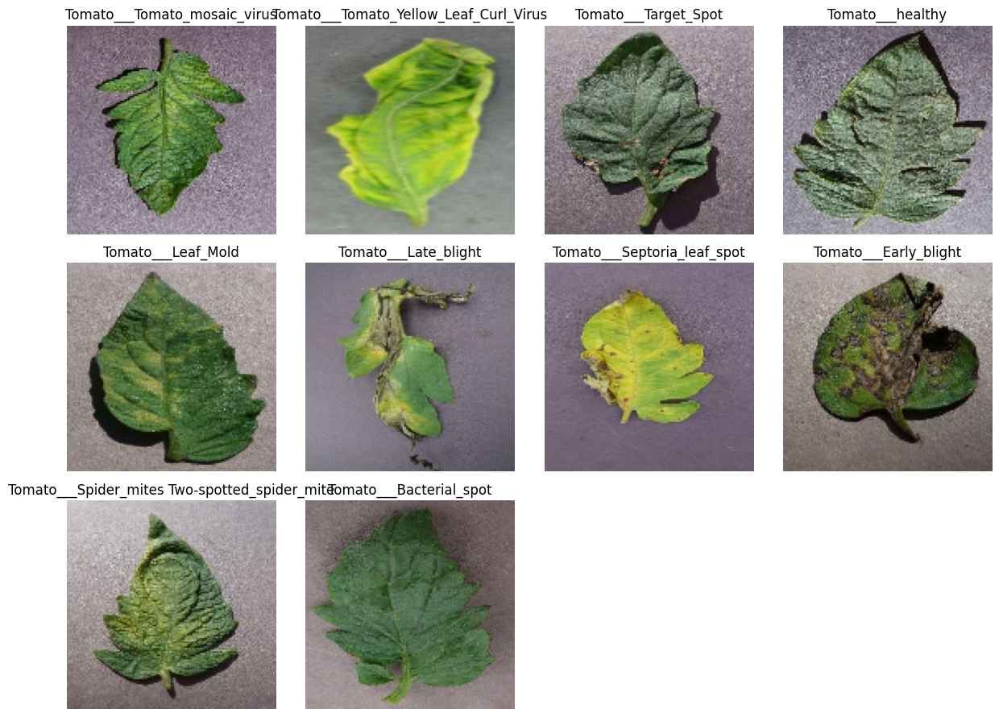

In [ ]:
def imshow(inp, title=None):
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.axis('off')

shown = set()
plt.figure(figsize=(15, 10))
images_to_show = []
titles_to_show = []
max_batches_to_check = 100

for images, labels in train_image_data.take(max_batches_to_check):
    for i in range(images.shape[0]):
      label_index = tf.argmax(labels[i]).numpy()
      label_name = class_names[label_index]


      if label_index not in shown and len(shown) < num_classes:
          images_to_show.append(images[i].numpy())
          titles_to_show.append(label_name)
          shown.add(label_index)

      if len(shown) == num_classes:
          break

    if len(shown) == num_classes:
      break


cols = 4
rows = (num_classes + cols - 1) // cols if num_classes > 0 else 1
plt.figure(figsize=(cols * 3, rows * 3))

for i in range(len(images_to_show)):
    plt.subplot(3, 4, i + 1)
    imshow(images_to_show[i], title=titles_to_show[i])


if len(shown) < num_classes:
    print(f"Warning: Could not display one image for all {num_classes} classes after checking {max_batches_to_check} batches. Displayed {len(shown)} unique classes.")

plt.tight_layout()
plt.show()

This photo shows one of each of the 10 tomato leaf problems from our study group. It lets us see each sickness and the good ones as well. This shows us what sort of info the model will pick up.

## Training the Model

### CNN Model Architecture Overview

The Convolutional Neural Network (cnn_model) made for seeing tomato leaf sickness is a serial setup with some main parts:

- **Input Layer**: It gets images of size (128, 128, 3). These are color pics with height and width both being 128 dots.

- **Convolutional and Pooling Layers**: It uses many sets of `Conv2D` and `MaxPooling2D` layers. These parts pull out layered parts from the pics. Each Conv2D is followed by `BatchNormalization` to keep the training stable and `ReLU activation` (Rectified Linear Unit). MaxPooling2D layers make the feature maps smaller. L2 regularization is put on the Conv2D layers to stop them from fitting too much to the data.

- **Flatten Layer:** The last pool layer is made flat into a one-line piece to go into the full layers.

- **Dropout Layer:** A `Dropout layer` comes next. It turns off some of the inputs at random when the system is learning. This stops the model from learning too much from the data.

- **Dense (Fully Connected) Layers:**
After the Dropout, there are many Dense layers. These layers handle learning big ideas from the data and do the last group picking. Leaky ReLU act is used here. L2 keep-in-line stuff is also put on these layers.
*   **Output Layer:** - The last `Dense` layer has 10 parts (for the 10 disease types) and uses `softmax` to give out a chance spread over these types.

The model is compiled with the `Adam` optimizer and `categorical_crossentropy` loss function, suitable for multi-class classification.

In [ ]:
cnn_model = Sequential([
        tf.keras.Input(shape=(128, 128, 3)),

        Conv2D(32, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.0001)),
        BatchNormalization(),
        MaxPooling2D(pool_size=(2, 2)),

        Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.0001)),
        BatchNormalization(),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.0001)),
        BatchNormalization(),
        MaxPooling2D(pool_size=(2, 2)),

        Conv2D(128, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.0001)),
        BatchNormalization(),
        MaxPooling2D(pool_size=(2, 2)),


        Conv2D(256, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.0001)),
        BatchNormalization(),
        MaxPooling2D(pool_size=(2, 2)),

        Flatten(),
        Dropout(0.5),

        Dense(512, activation='relu', kernel_regularizer=l2(0.001)),
        BatchNormalization(),
        Dropout(0.5),
        Dense(256, activation='leaky_relu', kernel_regularizer=l2(0.0001)),
        BatchNormalization(),
        Dropout(0.5),

        Dense(128, activation='leaky_relu', kernel_regularizer=l2(0.0001)),
        BatchNormalization(),
        Dropout(0.5),

        Dense(64, activation='leaky_relu', kernel_regularizer=l2(0.0001)),
        BatchNormalization(),
        Dropout(0.3),
        Dense(10, activation='softmax')
    ])

cnn_model.compile(optimizer = Adam(), loss='categorical_crossentropy', metrics=['accuracy'])
cnn_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 126, 126, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 126, 126, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 63, 63, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 61, 61, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 61, 61, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 30, 30, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 28, 28, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 28, 28, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 12, 12, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 12, 12, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 6, 6, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 4, 4, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 4, 4, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 2, 2, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 256)            │         1,02

 Total params: 1,129,290 (4.31 MB)

 Trainable params: 1,126,282 (4.30 MB)

 Non-trainable params: 3,008 (11.75 KB)

## Defining the callbacks

This part talks about some Keras callbacks used when a model is being trained to keep an eye on how it's doing and to tweak the training as needed:

*   **`EarlyStopping`:** - Stops training when it sees that a key number (here, the loss from validation) isn't getting better. This helps stop the model from over-learning.
*   **`ModelCheckpoint`:** - Saves the model while it is being trained. It often keeps the best version it sees, based on a key number (like how right it is on validation).
*   **`ReduceLROnPlateau`:** - Drops the learning speed when it sees that a key number (loss from validation) isn't getting better, helping the model get better in small steps.
*   **`TensorBoard`:** - Keeps logs of how training is going and other info so it can be looked at in TensorBoard. This helps in understanding the training process well.

In [ ]:
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

model_checkpoint = ModelCheckpoint('best_model.keras', monitor='val_accuracy', save_best_only=True, mode='max', verbose=1)

reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=0.000001, verbose=1)

log_dir = "logs/fit/model_training"
tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)

## Training the model

This part trains the ***convolutional neural network*** (`cnn_model`) using the ready training data (`train_image_data`) and checks how well it does on the test data (`val_image_data`) after every run-through.

It uses the `fit()` function to train, telling it how many times to run, where to test, and the list of checks set before. These checks keep an eye on training, keep the best version, change how fast it learns, and put info in TensorBoard for review.

In [ ]:
cnn_model.fit(
    train_image_data,
    epochs=150,
    validation_data=val_image_data,
    callbacks=[early_stopping, model_checkpoint, reduce_lr, tensorboard_callback]
)

Epoch 1/150
1246/1250 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.2256 - loss: 3.2372
Epoch 1: val_accuracy improved from -inf to 0.54200, saving model to best_model.keras
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 27s 8ms/step - accuracy: 0.2260 - loss: 3.2357 - val_accuracy: 0.5420 - val_loss: 2.1384 - learning_rate: 0.0010
Epoch 2/150
1242/1250 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.4726 - loss: 2.2712
Epoch 2: val_accuracy did not improve from 0.54200
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - accuracy: 0.4728 - loss: 2.2705 - val_accuracy: 0.5310 - val_loss: 2.0335 - learning_rate: 0.0010
Epoch 3/150
1248/1250 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5665 - loss: 1.9416
Epoch 3: val_accuracy improved from 0.54200 to 0.63700, saving model to best_model.keras
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - accuracy: 0.5665 - loss: 1.9414 - val_accuracy: 0.6370 - val_loss: 1.6864 - learning_rate: 0.0010
Epoch 4/150
1241/1250 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6018 - l

## TensorBoard Output

This part opens **TensorBoard** to see how the training is going. **TensorBoard** is a group of tools that make it easier to get what's going on in your machine learning work. By using the command `%tensorboard --logdir logs/fit/model_training`, you can check out a dashboard that lets you watch things such as:

- Loss and accuracy change with time.
- The graph of the model.
- Charts of weights and biases.
- And more.

In [ ]:
%load_ext tensorboard
%tensorboard --logdir logs/fit/model_training

<IPython.core.display.Javascript object>

I am attaching some screenshot of Tensorboard as during the conversion to html it was not showing in the html file.

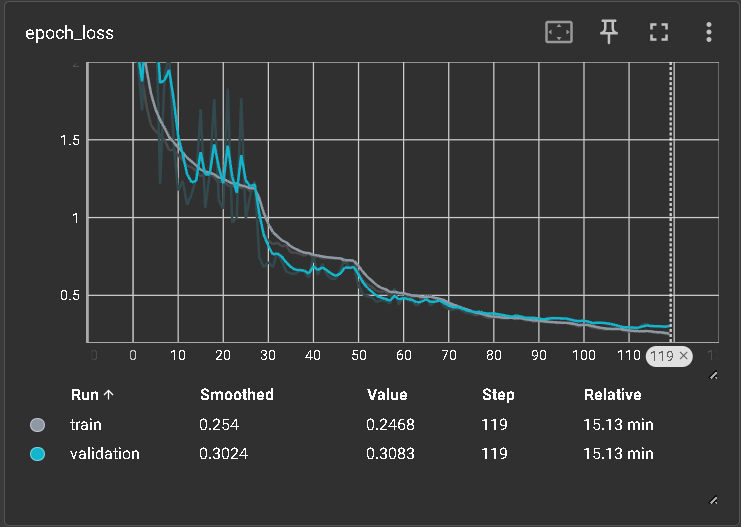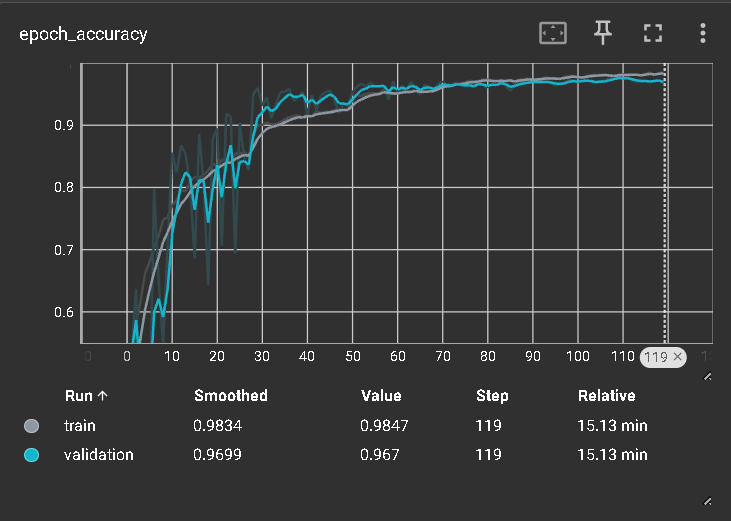

## Model Evaluation

- The model's work is checked on the test data set.
- We use the `evaluate()` function to find out the loss and accuracy.

In [ ]:
loss, accuracy = cnn_model.evaluate(val_image_data)

print(f"Validation Loss: {loss:2f}")
print(f"Validation Accuracy: {accuracy:.2f}")

125/125 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9875 - loss: 0.2484
Validation Loss: 0.284964
Validation Accuracy: 0.98


**CNN Model Experiment Log**  


| Sequence      || Description      | Accuracy | Loss      | Val. Accuracy      | Val. Loss      |
|:--- | :----|        |    :----:   |          :----: |          :----: |          :----: |
| 1       || Best Model      | 0.98       | 0.25   | 0.98   | 0.28   |
| 2       || Result when I add one more `Conv2d` layer of `128` filters      | 0.97       | 0.41   | 0.96   | 0.45   |
| 3       || Result when I add one more `Conv2d` layer of `512` filters      | 0.98       | 0.25   | 0.98   | 0.30   |
| 4       || Result when I add two more `Conv2d` layer of `64` and `128` filters      | 0.89       | 0.81   | 0.89   | 0.83   |
| 5       || Result when I removed the `batchnormalization`      | 0.88       | 0.75   | 0.87   | 0.79   |
| 6       || Result with extra `dense` layer of `256, 128, 64` units      | 0.94       | 0.25   | 0.94   | 0.77   |
| 7       || Result when I removed `Conv2d` layer of `512` filters and added the `dense` layer of `512` units     | 0.93       | 0.63   | 0.89   | 0.83   |
| 8       || Result when I change my `dropout` to 0.5 from 0.3     | 0.86       | 1.10   | 0.83   | 1.10   |
| 9       || Result when I change my output layer dropout to `0.3` from `0.5`      | 0.93       | 0.63   | 0.91   | 0.71   |
| 10      || Result when I change my activation function for all layers to `leaky_relu` from `relu`      | 0.98       | 0.35   | 0.98   | 0.37   |


## Saving the model

- First, **mount Google Drive** to make it seen within the **Colab** area.
- Then, **load the top model** saved when you were learning, by using the **ModelCheckpoint**.
- Now, **save this model file** to a path you pick in your Google Drive.

This way, even if the **Colab** stops, my model stays safe

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
best_model = tf.keras.models.load_model('best_model.keras')

drive_save_path = '/content/drive/MyDrive/tomato_leaf_disease_model.keras'

best_model.save(drive_save_path)

print(f"Model saved successfully to {drive_save_path}")

Model saved successfully to /content/drive/MyDrive/tomato_leaf_disease_model.keras


## Testing the model

This part tells you how to use a saved model on Google Drive to know what's in a photo from the test set. Here's how to do it:

- Load the model from a spot on Google Drive.
- Pick a photo at random from the test group.
- Get the photo ready for guessing (add a batch piece).
- Take a guess using the model you loaded.
- Show the photo with both the guessed and true names to see if it was guessed right.

In [ ]:
drive_load_path = '/content/drive/MyDrive/tomato_leaf_disease_model.keras'

loaded_model = tf.keras.models.load_model(drive_load_path)

print("Model loaded successfully from Google Drive.")

Model loaded successfully from Google Drive.


Shape of the single image batch: (1, 127, 127, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


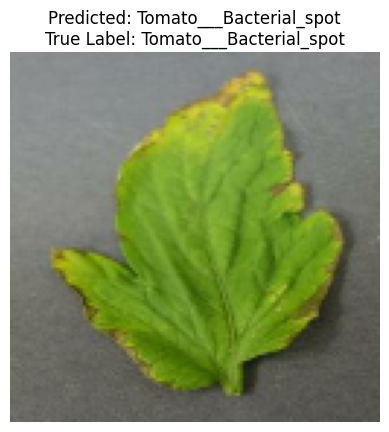

The model predicted the class: Tomato___Bacterial_spot


In [ ]:
import random

random_batch = random.choice(list(val_image_data))
example_images, example_labels = random_batch

random_index = random.randint(0, example_images.shape[0] - 1)
single_image = example_images[random_index]
true_label = example_labels[random_index]

single_image_batch = tf.expand_dims(single_image, 0)

print(f"Shape of the single image batch: {single_image_batch.shape}")

predictions = loaded_model.predict(single_image_batch)

predicted_class_index = tf.argmax(predictions, axis=1).numpy()[0]

predicted_class_name = class_names[predicted_class_index]

true_class_index = tf.argmax(true_label).numpy()
true_class_name = class_names[true_class_index]

plt.imshow(single_image.numpy())
plt.title(f"Predicted: {predicted_class_name}\nTrue Label: {true_class_name}")
plt.axis('off')
plt.show()

print(f"The model predicted the class: {predicted_class_name}")